### **IST 718 Big Data - Group 2 Video Game Sales**
James Eakins, Sean Middleton, Richard Bump, Jonathan Ortiz

# **Specification**
1. Background 
 
In 1972, the phenomenon known as video games began with a simple game called pong. Video games are now a multi-billion industry, with estimations of 125 billion dollars, this does not include brand deals, tournament winnings, and social media influencer pay. The industry is growing at a rate of 12.9%, and a single game could bring in billions of dollars annually (Fortnite). Because of this it is important that companies can predict these sales, and understand what their customers are going to buy. 

2. Hypotheses

a.   Can we accurately predict the global sales of a game?
b.   Can we predict whether a game will sell above or below the median sales?
c.   What is the best model to predict global sales of games?
d.   Which platform will produce the most future Sales?

3. Data from Kaggle

## **Required Data Transformations**
1. Created dummy variables for Genres and Platform,
2. Binned continuous User Scores to follow an ABCDF rating,
3. Created a new binary variable above or below median price (Average price was attempted but only 1% is above the average price),
4. Removed non-statistically significant variables above .05 for the regression models,
5. Changed Platform to Numbers, and 
6. Grouped similar platforms into condensed groups (i.e. PS, PS2, PS3, PS4, PSP and PSV into PS).



Set the data environment

In [ ]:
import os 
import pandas as pd
import numpy as np
import seaborn as sns
from google.colab import files
import io
import matplotlib.pyplot as plt

import warnings
from pandas import Series
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima_model import ARIMAResults
from math import sqrt
from pandas import DataFrame
from scipy.stats import boxcox



/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## **Obtain the Data Set**

In [ ]:
### this line of code allows your to choose the file to download
uploaded = files.upload()

Saving VG.csv to VG.csv


In [ ]:
#### Store our Video Game data into a dataframe
df = pd.read_csv(io.BytesIO(uploaded['VG.csv']))
df=pd.read_csv('VG.csv')
print(df)

                                Name Platform  ...  Developer Rating
0                         Wii Sports      Wii  ...   Nintendo      E
1                  Super Mario Bros.      NES  ...        NaN    NaN
2                     Mario Kart Wii      Wii  ...   Nintendo      E
3                  Wii Sports Resort      Wii  ...   Nintendo      E
4           Pokemon Red/Pokemon Blue       GB  ...        NaN    NaN
...                              ...      ...  ...        ...    ...
16714  Samurai Warriors: Sanada Maru      PS3  ...        NaN    NaN
16715               LMA Manager 2007     X360  ...        NaN    NaN
16716        Haitaka no Psychedelica      PSV  ...        NaN    NaN
16717               Spirits & Spells      GBA  ...        NaN    NaN
16718            Winning Post 8 2016      PSV  ...        NaN    NaN

[16719 rows x 16 columns]


## **Scrub the Data Set**

In [ ]:
# Function to gain an understanding of the data frame and if it requires cleaning. 
def Scrubbing(inputdf):
    #print('The first ten rows of data:')
    #print(inputdf.head(10))
    #print('The last ten rows of data:')
    #print(inputdf.tail(10))
    print('A sample of ten rows of data:')    
    print(inputdf.sample(10))
    print('The total number of NAs are:', inputdf.isna().sum(),'\n')
    print('The folowing types of data are included: ', inputdf.dtypes,'\n')
    print('The size of the data frame is: ',inputdf.shape,'\n')
    print('the dimensions of the data frame is: ', inputdf.ndim, '\n')
    total = inputdf.isnull().sum().sort_values(ascending=False)
    percent = (inputdf.isnull().sum()/inputdf.isnull().count()).sort_values(ascending=False)
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    print(missing_data.head(20))
    print(inputdf.info())
    print(inputdf.nunique())
    print(inputdf.describe())

# Calling for function df
Scrubbing(df)

A sample of ten rows of data:
                                                    Name  ... Rating
9673                                    Gladiator Begins  ...      M
4722                             God Eater 2: Rage Burst  ...      T
14456                               Ultimate Block Party  ...      E
13105                                         Expendable  ...    NaN
13979                                     Minna no Chizu  ...    NaN
7518                               NCAA March Madness 06  ...      E
10750                             Ben 10 Galactic Racing  ...      E
11049  Kawashima Ryuuta Kyouju Kanshuu Nouryoku Train...  ...    NaN
11055            Ratchet & Clank Future: Quest for Booty  ...    NaN
8682                           Toriko: Gourmet Monsters!  ...    NaN

[10 rows x 16 columns]
The total number of NAs are: Name                  2
Platform              0
Year_of_Release     269
Genre                 2
Publisher            54
NA_Sales              0
EU_Sales      

In [ ]:
### clean our data 
df2 = df.dropna()
print(df2)
for col in df2.columns: 
    print(col) 


                                    Name Platform  ...           Developer Rating
0                             Wii Sports      Wii  ...            Nintendo      E
2                         Mario Kart Wii      Wii  ...            Nintendo      E
3                      Wii Sports Resort      Wii  ...            Nintendo      E
6                  New Super Mario Bros.       DS  ...            Nintendo      E
7                               Wii Play      Wii  ...            Nintendo      E
...                                  ...      ...  ...                 ...    ...
16667         E.T. The Extra-Terrestrial      GBA  ...       Fluid Studios      E
16677     Mortal Kombat: Deadly Alliance      GBA  ...     Criterion Games      M
16696  Metal Gear Solid V: Ground Zeroes       PC  ...  Kojima Productions      M
16700                             Breach       PC  ...        Atomic Games      T
16706            STORM: Frontline Nation       PC  ...              SimBin   E10+

[6825 rows x 16

# **Observation**






Sales - Most games do not sell well, while a few games sell incredible amounts, right skewed. Our sales data in 2009 show declines, and only goes until 2016, the actual trend during this time is upward. This may be due two things:  Less major platforms and Rise of mobile gaming.

Platforms - There is some overlapping in time, but for the most part Platforms have their era’s. However, PC gaming is the most consistent platform over time. The PS2 has more sales in our data set, but not every game is in our data set. This may cause some bias.

Variable Relationships - A few independent variables look as if they will have more of an impact than others in general.  This becomes even more apparent when you look at it by platform

## **Explore the Data Set**

In [ ]:
#Summary Statistics of the Numeric Variables
df.describe()

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Count
count,16450.000000,16719.000000,16719.000000,16719.000000,16719.000000,16719.000000,8137.000000,8137.000000,7590.000000
mean,2006.487356,0.263330,0.145025,0.077602,0.047332,0.533543,68.967679,26.360821,162.229908
std,5.878995,0.813514,0.503283,0.308818,0.186710,1.547935,13.938165,18.980495,561.282326
min,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000,13.000000,3.000000,4.000000
25%,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000,60.000000,12.000000,10.000000
50%,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000,71.000000,21.000000,24.000000
75%,2010.000000,0.240000,0.110000,0.040000,0.030000,0.470000,79.000000,36.000000,81.000000
max,2020.000000,41.360000,28.960000,10.220000,10.570000,82.530000,98.000000,113.000000,10665.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f43f6e7e5c0>,
      dtype=object)

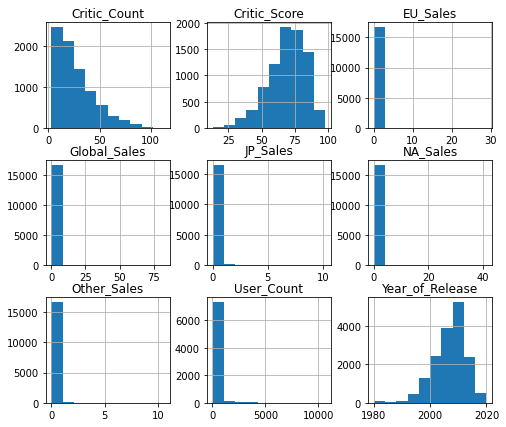

In [ ]:
#histograms of the numeric variables
df.hist(figsize = (8,7))

The plots below show the skewness of sales, and just how difficult it is to have a top/ high grossing game. 


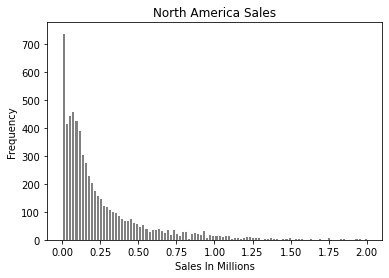

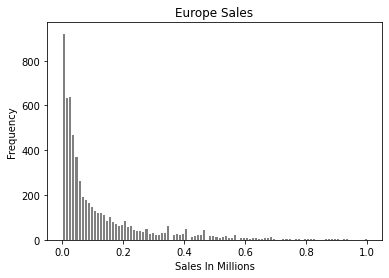

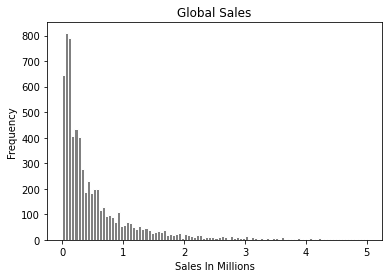

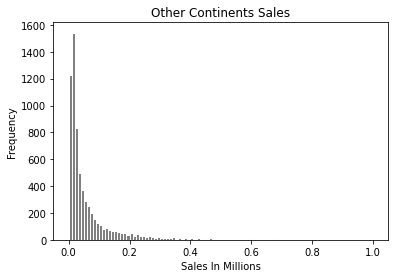

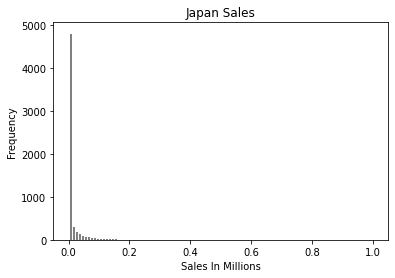

In [ ]:
### Some Exploratory Data Analysis
# matplotlib histogram
plt.hist(df2['NA_Sales'], range=[0, 2], facecolor='gray', align='mid', color = 'blue', edgecolor = 'white',
         bins = int(100))
# Add labels
plt.title('North America Sales')
plt.xlabel('Sales In Millions')
plt.ylabel('Frequency')
plt.show()

# matplotlib histogram
plt.hist(df2['EU_Sales'], range=[0, 1], facecolor='gray', align='mid', color = 'blue', edgecolor = 'white',
         bins = int(100))
# Add labels
plt.title('Europe Sales')
plt.xlabel('Sales In Millions')
plt.ylabel('Frequency')
plt.show()

# matplotlib histogram
plt.hist(df2['Global_Sales'], range=[0, 5], facecolor='gray', align='mid', color = 'blue', edgecolor = 'white',
         bins = int(100))
# Add labels
plt.title('Global Sales')
plt.xlabel('Sales In Millions')
plt.ylabel('Frequency')
plt.show()

# matplotlib histogram
plt.hist(df2['Other_Sales'], range=[0, 1], facecolor='gray', align='mid', color = 'blue', edgecolor = 'white',
         bins = int(100))
# Add labels
plt.title('Other Continents Sales')
plt.xlabel('Sales In Millions')
plt.ylabel('Frequency')
plt.show()

# matplotlib histogram
plt.hist(df2['JP_Sales'], range=[0, 1], facecolor='gray', align='mid', color = 'blue', edgecolor = 'white',
         bins = int(100))
# Add labels
plt.title('Japan Sales')
plt.xlabel('Sales In Millions')
plt.ylabel('Frequency')
plt.show()

The graph below shows the cut off year and downward collection of video game data after 2009, with online research i.e google, we know video game sales are still on the rise. 

Text(0, 0.5, 'Sales')

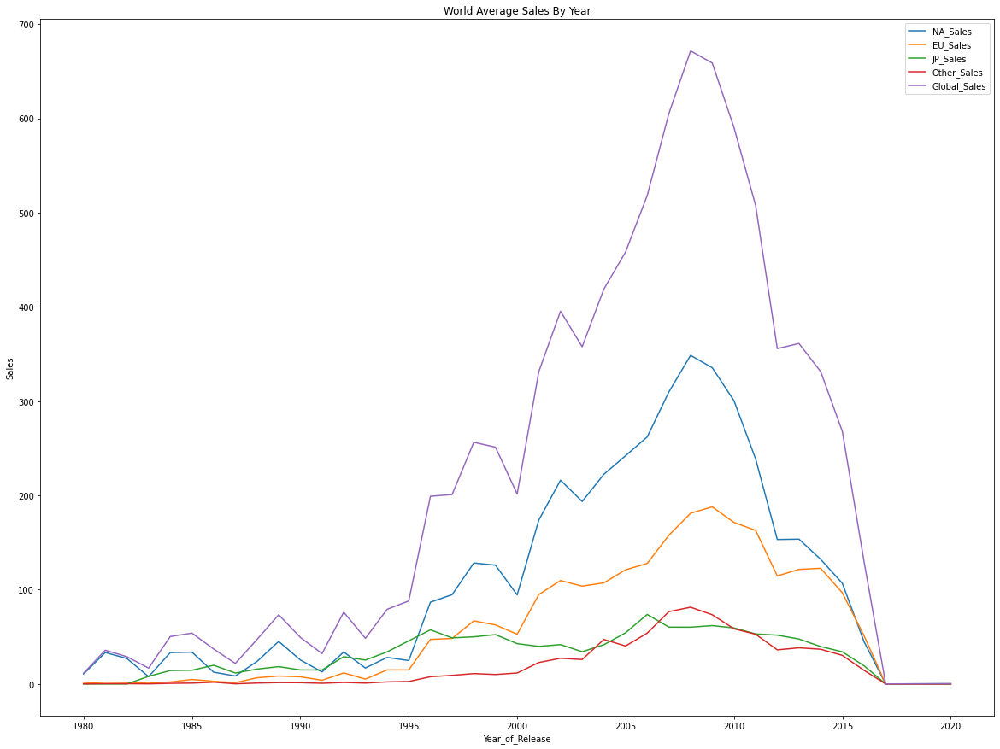

In [ ]:
##########################################################
# Average Totals Sales Time series by year with Forecast #
##########################################################
plt.rcParams['figure.figsize'] = (20,15)

cols = [0,1,3,4,10,11,12,13,14,15]
ALL_Sales_By_Year = df.drop(df.columns[cols],axis=1)
ALL_Sales_By_Year = ALL_Sales_By_Year.dropna()
ALLSALES = ALL_Sales_By_Year.groupby(['Year_of_Release']).sum()
ALLSALES.plot()
plt.title('World Average Sales By Year')
plt.ylabel('Sales')

The violin plot shows the platform and what era they were apart of, all console have their time and have a life cycle before a next generation console comes out, however, Personal Computer gaming is forever it seems. 

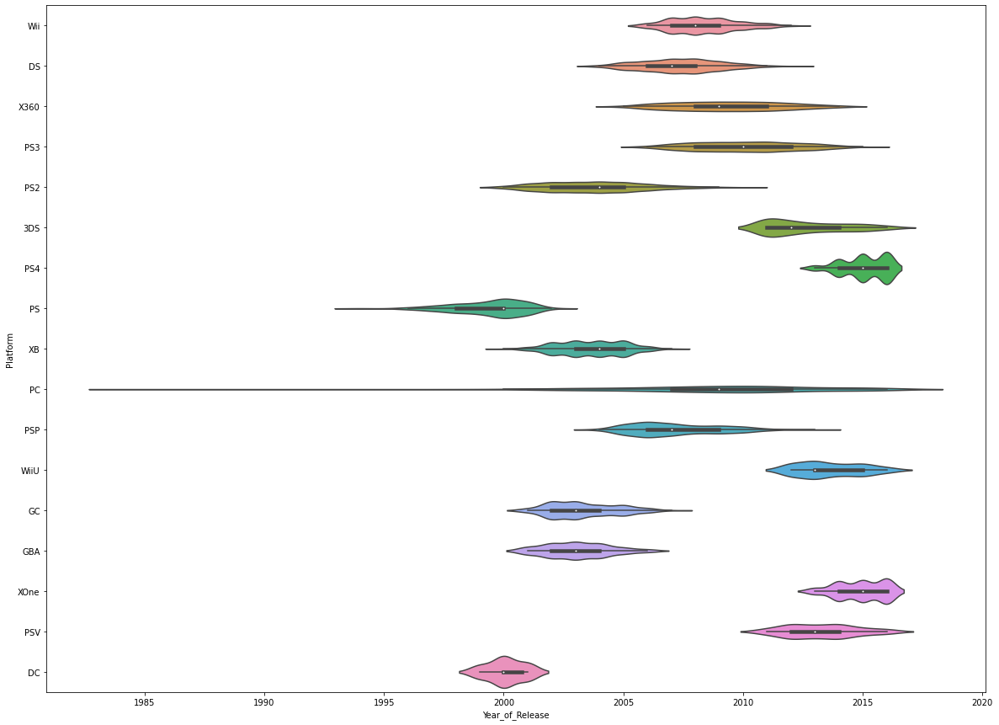

In [ ]:
# Count of Games by Platform per year
plt.rcParams['figure.figsize'] = (20,15)
Platforms = df2[["Platform", "Year_of_Release", "NA_Sales"]]
Platforms.head()
ay = sns.violinplot(x="Year_of_Release", y="Platform", data=Platforms)


Our data does not have all games that have been out for each console and their is a bit of bias among platforms. 

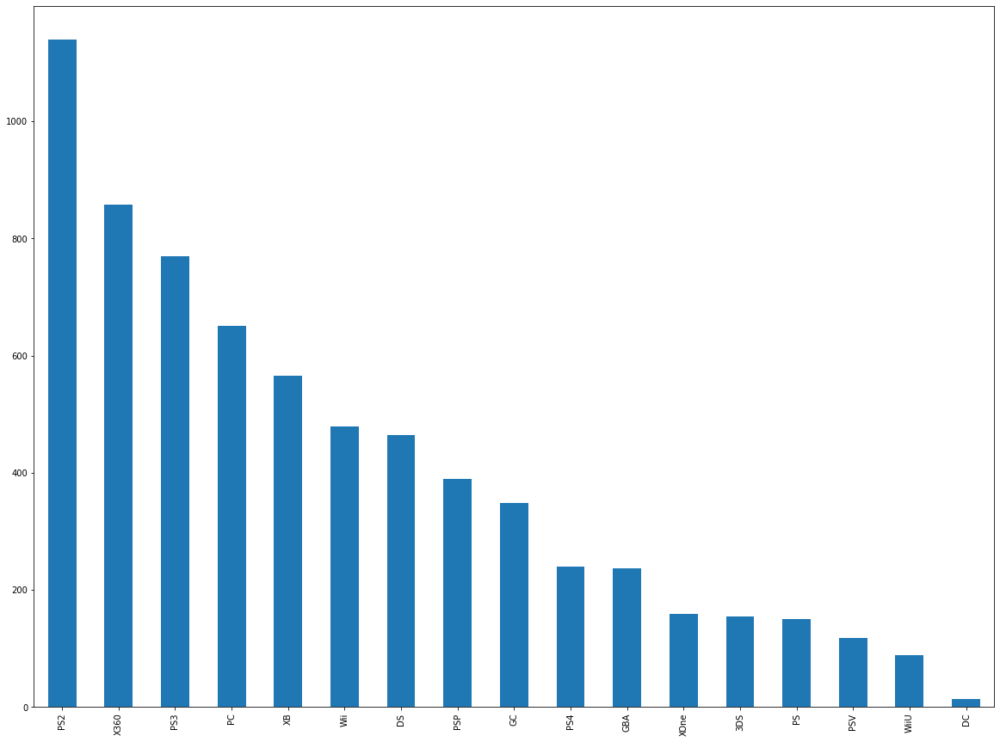

In [ ]:
# How many games sold per console
countofconsolegames = Platforms.Platform.value_counts()
countofconsolegames.plot.bar()

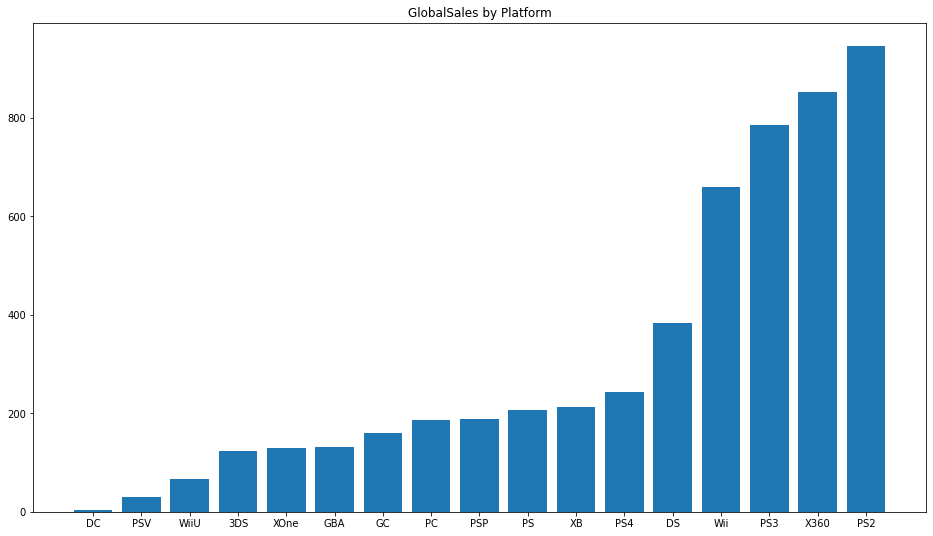

In [ ]:
import numpy as numpy
from matplotlib import pyplot as plt
%matplotlib inline
result =df2.groupby(['Platform'])['Global_Sales'].aggregate(np.sum).reset_index().sort_values('Global_Sales')

gs=plt.rcParams["figure.figsize"] = [16,9]
gs=plt.bar(result['Platform'], result['Global_Sales'])
gs=plt.title("GlobalSales by Platform")
gs=plt.show()

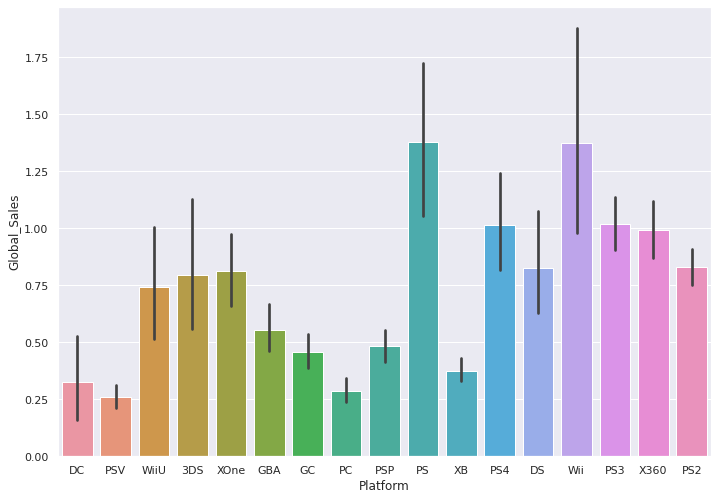

In [ ]:
# Sales by Platform Sean
result = df2.groupby(['Platform'])['Global_Sales'].aggregate(np.sum).reset_index().sort_values('Global_Sales')
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.barplot(x='Platform', y="Global_Sales", data=df2, order=result['Platform'])

In [ ]:
result

,Platform,Global_Sales
1,DC,4.55
11,PSV,30.88
13,WiiU,66.08
0,3DS,123.23
16,XOne,129.57
3,GBA,131.75
4,GC,159.42
5,PC,187.12
10,PSP,187.92
6,PS,206.55


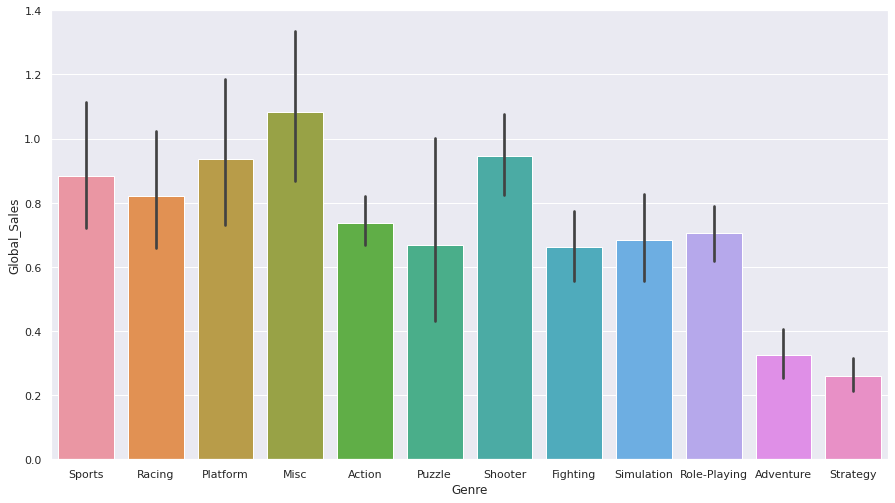

In [ ]:
# Sales by Genre
sns.set(rc={'figure.figsize':(15,8.27)})
sns.barplot(x='Genre', y='Global_Sales', data=df2)

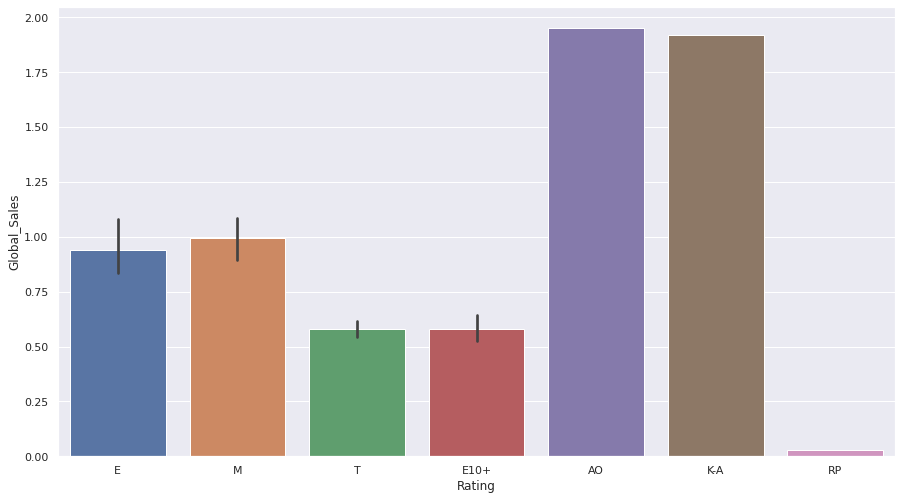

In [ ]:
# rating vs sales
sns.set(rc={'figure.figsize':(15,8.27)})
sns.barplot(x='Rating', y='Global_Sales', data=df2)

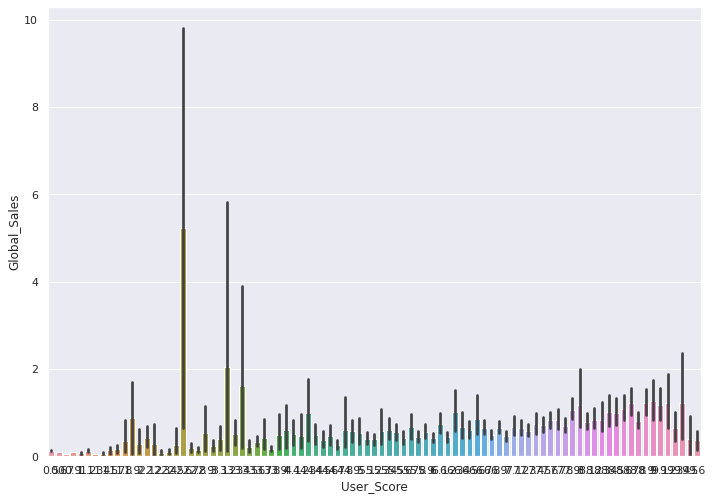

In [ ]:
# User rating vs sales
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.barplot(x='User_Score', y='Global_Sales', data=df2)

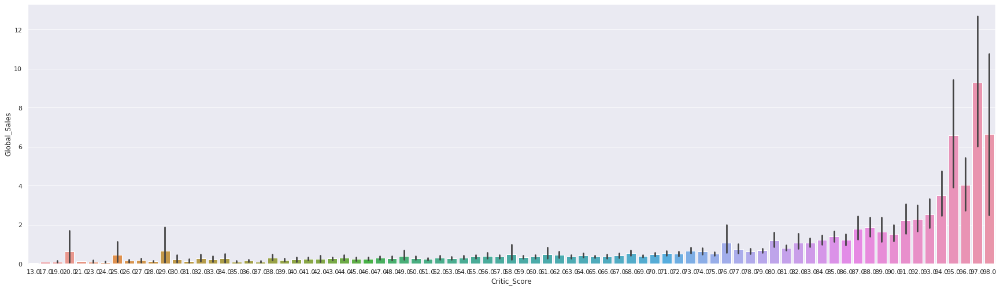

In [ ]:
# Critic Score vs sales
sns.set(rc={'figure.figsize':(30,8.27)})
sns.barplot(x='Critic_Score', y='Global_Sales', data=df2)

In [ ]:
bins = [0,2,4,6,8,10]
groupnames = ('F','D','C','B','A')
df2.User_Score = pd.cut(df2.User_Score.astype(float), bins, labels = groupnames)
print(df2.User_Score)


0        B
2        A
3        B
6        A
7        B
        ..
16667    D
16677    A
16696    B
16700    C
16706    B
Name: User_Score, Length: 6825, dtype: category
Categories (5, object): [F < D < C < B < A]


/usr/local/lib/python3.6/dist-packages/pandas/core/generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [ ]:
# Cut off the year at 2009 and then forecast average global sale with arima model.
# The 3 plots previous show we have alot of bias in our data for certain platforms, which only sold mostly before 2010, newer consoles do not have as many games.
# We can use Data via the internet to check our timeseries model to see how close our prediction were 
# redo linear regression mode Remove Other sales and EU Sales

DFwithDummies = pd.get_dummies(df2, columns=['Genre','Platform','User_Score','Rating'], drop_first = True)
DFwithDummies.shape
Y = DFwithDummies["Global_Sales"]
X = DFwithDummies.drop(["NA_Sales", "Global_Sales", "Name", "Publisher", "Developer", "EU_Sales", "Other_Sales"], axis=1)

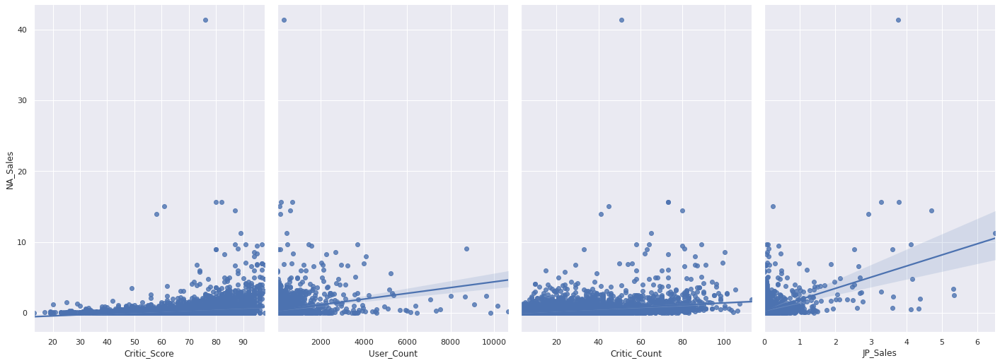

In [ ]:
sns.pairplot(DFwithDummies, x_vars= ['Critic_Score','User_Count', 'Critic_Count', 'JP_Sales'], y_vars='NA_Sales', height=7, aspect=0.7, kind='reg')


In [ ]:
### Corelation Plot
corr = DFwithDummies.corr()
corr.style.background_gradient(cmap='coolwarm')

In [ ]:
#Change 'Year_of_Release' to datatime data type
df['Year_of_Release'] = pd.to_datetime(df['Year_of_Release'],format='%Y')
df.dtypes
df.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006-01-01,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985-01-01,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008-01-01,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009-01-01,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996-01-01,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN


# **Analyze**
1.  Explain what types of analysis you used.
2.  Explain how you arrived at the model you used for your recommendation.

 **Models**

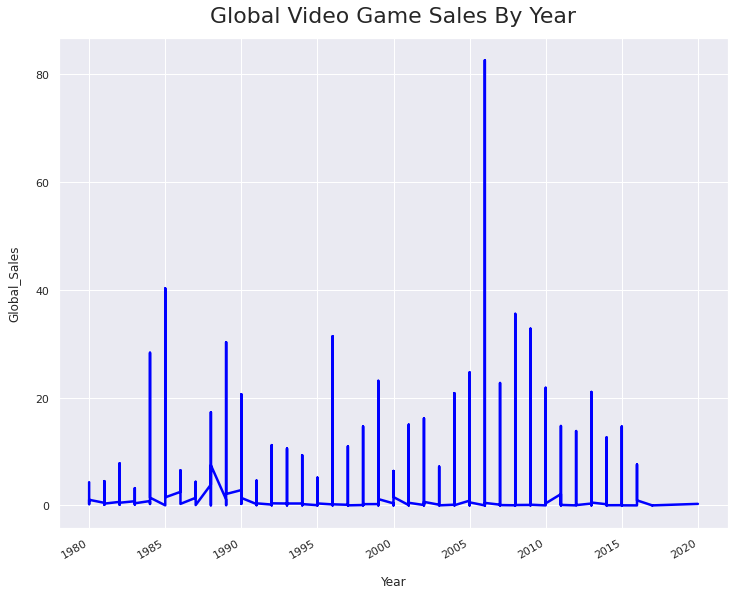

In [ ]:
#First Draft of Time Series
df.set_index('Year_of_Release')['Global_Sales'].plot(figsize=(12, 10), linewidth=2.5, color='blue')
plt.xlabel("Year", labelpad=15)
plt.ylabel("Global_Sales", labelpad=15)
plt.title("Global Video Game Sales By Year", y=1.02, fontsize=22);

## **Linear Regression**

The linear regression model was used to try and predict exact sales, however, this was not the best method. The R^2 of .47 is nothing to be excited about, along with the MAE of .6. Moreover, there is some useful information from this model, the most influential factor happens to be rating, specifically K-A rating, and the top 3 platforms are Xbox1, Wii, Xbox 360.


In [ ]:
import statsmodels.api as sm
import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt  
import seaborn as seabornInstance 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
import sklearn
from sklearn import linear_model
%matplotlib inline


DFwithDummies = pd.get_dummies(df2, columns=['Genre','Platform','User_Score','Rating'], drop_first = True)
DFwithDummies.shape
Y = DFwithDummies["Global_Sales"]
X = DFwithDummies.drop(["Platform_PSV","Rating_RP","Critic_Count","Platform_PC","NA_Sales", "Global_Sales", "Name", "Publisher", "Developer", "EU_Sales", "Other_Sales","Genre_Fighting","Genre_Puzzle","Genre_Platform","Genre_Racing","Genre_Simulation","Genre_Sports","Platform_DS","Platform_GBA","Platform_GC","Platform_PS","Platform_PS4","Platform_PSP","Platform_WiiU","Platform_XB","User_Score_D","User_Score_C","User_Score_B","Rating_E","Rating_E10+","Rating_M","Rating_T","Genre_Adventure","Genre_Misc","Genre_Shooter","Genre_Strategy"], axis=1)
 
# with sklearn
regr = linear_model.LinearRegression()
regr.fit(X, Y)
print('Intercept: \n', regr.intercept_)
print('Coefficients: \n', regr.coef_)

# prediction with sklearn
#Year_of_Release =
#JP_Sales =
#Critic_Score =
#User_Count =
#Genre_Role-Playing =
#Platform_PS2 =
#Platform_PS3 =
#Platform_Wii =
#Platform_X360 =
#Platform_XOne =
#User_Score_A =
#Rating_K-A =
#print ('Predicted Global Sales: \n', regr.predict([[Year_of_Release,JP_Sales,Critic_Score,User_Count,Genre_Role-Playing,Platform_PS2,Platform_PS3,Platform_Wii,Platform_X360,Platform_XOne,User_Score_A,Rating_K-A ]]))

# with statsmodels
X = sm.add_constant(X) # adding a constant
 
model = sm.OLS(Y, X).fit()
predictions = model.predict(X) 
 
print_model = model.summary()
print(print_model)
from sklearn.metrics import mean_absolute_error
mean_absolute_error(Y, predictions)
from sklearn.metrics import mean_squared_error
mean_squared_error(Y, predictions)

Intercept: 
 51.27673166602878
Coefficients: 
 [-2.61095823e-02  4.10875975e+00  2.00246627e-02  7.16391042e-04
 -6.37340563e-01 -9.22509616e-01  3.71921341e-01  4.58377958e-01
  8.65210222e-01  6.93563795e-01  4.94238894e-01 -2.75662379e-01
 -5.11745035e+00]
                            OLS Regression Results                            
Dep. Variable:           Global_Sales   R-squared:                       0.474
Model:                            OLS   Adj. R-squared:                  0.473
Method:                 Least Squares   F-statistic:                     472.5
Date:                Sun, 14 Jun 2020   Prob (F-statistic):               0.00
Time:                        00:27:48   Log-Likelihood:                -12095.
No. Observations:                6825   AIC:                         2.422e+04
Df Residuals:                    6811   BIC:                         2.431e+04
Df Model:                          13                                         
Covariance Type:            n

2.0266886340255055

In [ ]:
uploaded = files.upload()

Saving VG_Med_Avg.csv to VG_Med_Avg.csv


In [ ]:
#### Store our Video Game data into a dataframe
DF = pd.read_csv(io.BytesIO(uploaded['VG_Med_Avg.csv']))
DF=pd.read_csv('VG_Med_Avg.csv')
print(DF)

                                Name  ... Greater_Than_Median
0                         Wii Sports  ...                   1
1                  Super Mario Bros.  ...                   1
2                     Mario Kart Wii  ...                   1
3                  Wii Sports Resort  ...                   1
4           Pokemon Red/Pokemon Blue  ...                   1
...                              ...  ...                 ...
16714  Samurai Warriors: Sanada Maru  ...                   0
16715               LMA Manager 2007  ...                   0
16716        Haitaka no Psychedelica  ...                   0
16717               Spirits & Spells  ...                   0
16718            Winning Post 8 2016  ...                   0

[16719 rows x 20 columns]


In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
import sklearn

In [ ]:
DF = DF.dropna()
DF2 = DF.drop(["NA_Sales","EU_Sales","JP_Sales","Other_Sales","Global_Sales","Median_Sale_Plat","Name","Publisher","AVG_Sale_Plat","Greater_Than_AVG"], axis=1)
bins = [0,2,4,6,8,10]
groupnames = ('F','D','C','B','A')
DF2.User_Score = pd.cut(DF2.User_Score.astype(float), bins, labels = groupnames)
print(DF2.User_Score)
DF2 = pd.get_dummies(DF2, columns=['Genre','Platform','User_Score','Rating','Developer'], drop_first = True)
DF2.head()

NameError: ignored

In [ ]:
TrainDF, TestDF = train_test_split(DF2, test_size=0.3)
TestLabels=TestDF["Greater_Than_Median"]
print(TestLabels)
## remove labels
TestDF = TestDF.drop(["Greater_Than_Median"], axis=1)
print(TestDF)

TrainDF_nolabels=TrainDF.drop(["Greater_Than_Median"], axis=1)
print(TrainDF_nolabels)

TrainLabels=TrainDF["Greater_Than_Median"]
print(TrainLabels)

9985     0
163      1
4493     1
7498     0
6630     1
        ..
974      1
4358     1
786      1
12760    0
8189     1
Name: Greater_Than_Median, Length: 2048, dtype: int64
       Year_of_Release  Critic_Score  ...  Developer_syn Sophia  Developer_zSlide
9985            2002.0          54.0  ...                     0                 0
163             2008.0          81.0  ...                     0                 0
4493            2013.0          62.0  ...                     0                 0
7498            2013.0          61.0  ...                     0                 0
6630            2015.0          67.0  ...                     0                 0
...                ...           ...  ...                   ...               ...
974             2010.0          89.0  ...                     0                 0
4358            2016.0          85.0  ...                     0                 0
786             1998.0          81.0  ...                     0                 0
12760

Top 3 Platforms : Wii, Xbox1, Xbox 360
R squared : .47
Most influential factor is the Rating of K-A
MAE : .6
MSE : 2.03 

## **Naive Bayes**

In [ ]:
MyModelNB = MultinomialNB()

MyModelNB.fit(TrainDF_nolabels, TrainLabels)
Prediction = MyModelNB.predict(TestDF)
print("\nThe prediction from NB is:")
print(Prediction)
print("\nThe actual labels are:")
print(TestLabels)
## confusion matrix
from sklearn.metrics import confusion_matrix
## The confusion matrix is square and is labels X labels
cnf_matrix = confusion_matrix(TestLabels, Prediction)
print("\nThe confusion matrix is:")
print(cnf_matrix)
### prediction probabilities
## columns are the labels in alphabetical order
## The decinal in the matrix are the prob of being
## that label
print(np.round(MyModelNB.predict_proba(TestDF),2))


The prediction from NB is:
[0 1 1 ... 0 0 0]

The actual labels are:
9985     0
163      1
4493     1
7498     0
6630     1
        ..
974      1
4358     1
786      1
12760    0
8189     1
Name: Greater_Than_Median, Length: 2048, dtype: int64

The confusion matrix is:
[[634  44]
 [976 394]]
[[1. 0.]
 [0. 1.]
 [0. 1.]
 ...
 [1. 0.]
 [1. 0.]
 [1. 0.]]


The Naive Bayes has a 49% accuracy in determining whether a game will be above or below the median.

## **Random Forest**

Random Forest model was used to determine the importance of features to predict future sales of each platform. The first Random Forest model is created by using the regressor. It predicted that global sales is more important feature among the other sales variables. Also, the classifier determined the which Platform would be the most favored by the gamers. The classifer model used 'greater than median' and 'global-sales' to generate the decision tree model.

In [ ]:
import os 
import pandas as pd
import numpy as np
import seaborn as sns
from google.colab import files
import io
import matplotlib.pyplot as plt

import warnings
from pandas import Series
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima_model import ARIMAResults
from math import sqrt
from pandas import DataFrame
from scipy.stats import boxcox

# Function to gain an understanding of the data frame and if it requires cleaning. 
def Scrubbing(inputdf):
    #print('The first ten rows of data:')
    #print(inputdf.head(10))
    #print('The last ten rows of data:')
    #print(inputdf.tail(10))
    print('A sample of ten rows of data:')    
    print(inputdf.sample(10))
    print('The total number of NAs are:', inputdf.isna().sum(),'\n')
    print('The folowing types of data are included: ', inputdf.dtypes,'\n')
    print('The size of the data frame is: ',inputdf.shape,'\n')
    print('the dimensions of the data frame is: ', inputdf.ndim, '\n')
    total = inputdf.isnull().sum().sort_values(ascending=False)
    percent = (inputdf.isnull().sum()/inputdf.isnull().count()).sort_values(ascending=False)
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    print(missing_data.head(20))
    print(inputdf.info())
    print(inputdf.nunique())
    print(inputdf.describe())


In [ ]:
#### Store our Video Game data into a dataframe
DF = pd.read_csv('VG.csv')
DF = DF.dropna()
# Calling for function df
Scrubbing(DF)
DF3 = DF.drop(["Rating","Publisher"], axis=1)
d = {ni: indi for indi, ni in enumerate(set(DF3.Platform))}
e = {ni: indi for indi, ni in enumerate(set(DF3.Name))}
DF3['Platform_Num']= [d[ni] for ni in DF3.Platform]
DF3['Name_Num']= [e[ni] for ni in DF3.Name]

A sample of ten rows of data:
                                       Name  ... Rating
5312                         Guilty Gear X2  ...      T
5466             Tak 2: The Staff of Dreams  ...      E
13043                Ferrari F355 Challenge  ...      E
14906            Bully: Scholarship Edition  ...      T
11750                         Cosmic Family  ...      E
14308          FIFA World Cup: Germany 2006  ...      E
2819   Harvest Moon DS: Island of Happiness  ...      E
2454                      Tales of Xillia 2  ...      T
6796                     Samurai Warriors 4  ...      T
1137                            Kinectimals  ...      E

[10 rows x 16 columns]
The total number of NAs are: Name               0
Platform           0
Year_of_Release    0
Genre              0
Publisher          0
NA_Sales           0
EU_Sales           0
JP_Sales           0
Other_Sales        0
Global_Sales       0
Critic_Score       0
Critic_Count       0
User_Score         0
User_Count         0
Develop

Mean Absolute Error: 0.1585913919907514
Mean Squared Error: 0.2671609700376085
Root Mean Squared Error: 0.5168761650894811


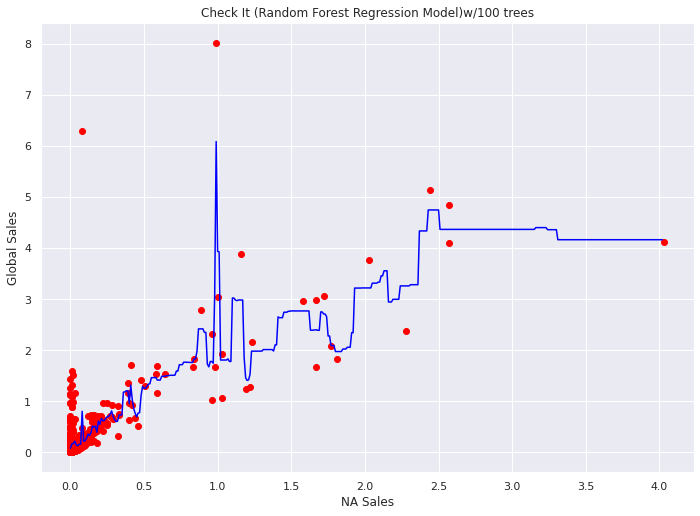

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor 

DF3_PC = DF3[DF3['Platform']=="PC"]
X = DF3_PC.iloc[:, 4:5].values
y = DF3_PC.iloc[:, 8].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
 # create regressor object 
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0) 
  
# fit the regressor with x and y data 
regressor.fit(X, y)   

Y_pred = regressor.predict(X_test) 

from sklearn import metrics

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, Y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, Y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, Y_pred)))

X_grid = np.arange(min(X), max(X), 0.01)
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(X, y, color = 'red')
plt.plot(X_grid, regressor.predict(X_grid), color = 'blue')
plt.title('Check It (Random Forest Regression Model)w/100 trees')
plt.xlabel('NA Sales')
plt.ylabel('Global Sales')
plt.show()

Mean Absolute Error: 0.163008743779027
Mean Squared Error: 0.07731204092152401
Root Mean Squared Error: 0.27805042873824887


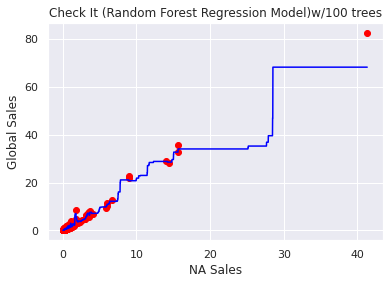

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor 

DF3_Wii = DF3[DF3['Platform']=="Wii"]
X = DF3_Wii.iloc[:, 4:5].values
y = DF3_Wii.iloc[:, 8].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
 # create regressor object 
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0) 
  
# fit the regressor with x and y data 
regressor.fit(X, y)   

Y_pred = regressor.predict(X_test) 

from sklearn import metrics

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, Y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, Y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, Y_pred)))

X_grid = np.arange(min(X), max(X), 0.01)
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(X, y, color = 'red')
plt.plot(X_grid, regressor.predict(X_grid), color = 'blue')
plt.title('Check It (Random Forest Regression Model)w/100 trees')
plt.xlabel('NA Sales')
plt.ylabel('Global Sales')
plt.show()

Mean Absolute Error: 0.12148314981835089
Mean Squared Error: 0.04096574452215486
Root Mean Squared Error: 0.20239996176421293


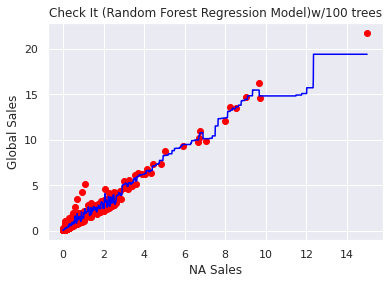

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor 

DF3_X360 = DF3[DF3['Platform']=="X360"]
X = DF3_X360.iloc[:, 4:5].values
y = DF3_X360.iloc[:, 8].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
 # create regressor object 
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0) 
  
# fit the regressor with x and y data 
regressor.fit(X, y)   

Y_pred = regressor.predict(X_test) 

from sklearn import metrics

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, Y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, Y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, Y_pred)))

X_grid = np.arange(min(X), max(X), 0.01)
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(X, y, color = 'red')
plt.plot(X_grid, regressor.predict(X_grid), color = 'blue')
plt.title('Check It (Random Forest Regression Model)w/100 trees')
plt.xlabel('NA Sales')
plt.ylabel('Global Sales')
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.svm import SVR

string= "PS2","PC","PS3","PS4","Wii","DS","PSP","XOne","XB","X360"
DF3=DF3[DF3['Platform'].isin(string)]
X = DF3[['EU_Sales','Global_Sales','Critic_Score','User_Score']]
y = DF3['NA_Sales']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=0)
svr = SVR()
svr.fit(X_train, y_train)
print(svr.score(X_train, y_train))
print(svr.score(X_test, y_test))

0.6835009766148463
0.8293036954405097


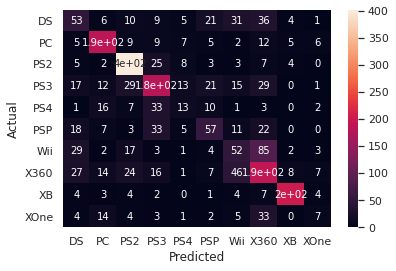

In [ ]:
X = DF3[['NA_Sales','EU_Sales','Global_Sales','Critic_Score','Other_Sales']]
y = DF3['Platform']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.4,random_state=0)
clf = RandomForestClassifier(n_estimators=1000)
clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)
confusion_matrix = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])
sn.heatmap(confusion_matrix, annot=True)

In [ ]:
print('Accuracy: ',metrics.accuracy_score(y_test,y_pred))
plt.show()

Accuracy:  0.5888013998250219


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))
print(accuracy_score(y_test, y_pred))

[[ 53   6  10   9   5  21  31  36   4   1]
 [  5 188   9   9   7   5   2  12   5   6]
 [  5   2 402  25   8   3   3   7   4   0]
 [ 17  12  29 181  13  21  15  29   0   1]
 [  1  16   7  33  13  10   1   3   0   2]
 [ 18   7   3  33   5  57  11  22   0   0]
 [ 29   2  17   3   1   4  52  85   2   3]
 [ 27  14  24  16   1   7  46 191   8   7]
 [  4   3   4   2   0   1   4   7 202   4]
 [  4  14   4   3   1   2   5  33   0   7]]
              precision    recall  f1-score   support

          DS       0.33      0.30      0.31       176
          PC       0.71      0.76      0.73       248
         PS2       0.79      0.88      0.83       459
         PS3       0.58      0.57      0.57       318
         PS4       0.24      0.15      0.19        86
         PSP       0.44      0.37      0.40       156
         Wii       0.31      0.26      0.28       198
        X360       0.45      0.56      0.50       341
          XB       0.90      0.87      0.89       231
        XOne       0.23     

Random Forest Regressor Results 
1. Accuracy : 58.8%
2. 3 example platforms shows that Global sales goes increases when North America Sales increases.
3. NA Sales and Global Sales are the most important features to predict the sales


0    0.245409
3    0.212123
2    0.188673
1    0.186587
4    0.167208
dtype: float64


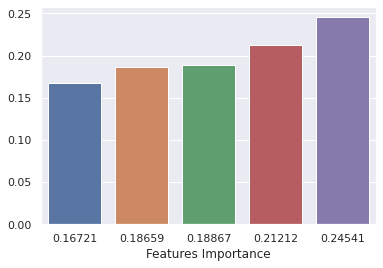

In [ ]:
featureImportances = pd.Series(clf.feature_importances_).sort_values(ascending=False)
print(featureImportances)

sn.barplot(x=round(featureImportances,5), y=featureImportances)
plt.xlabel('Features Importance')
plt.show()

In [ ]:
from sklearn.tree import DecisionTreeClassifier
import statsmodels.api as sm
import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt  
import seaborn as seabornInstance 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
import sklearn
from sklearn import linear_model
DF=pd.read_csv('VG_Med_Avg.csv')
print(DF)
DF = DF.dropna()
string= "PS2","PC","PS3","PS4","Wii","XOne","X360"
DF=DF[DF['Platform'].isin(string)]
d = {ni: indi for indi, ni in enumerate(set(DF.Platform))}
DF['Platform_Num'] = [d[ni] for ni in DF.Platform]
DF2 = DF.drop(["Critic_Score","User_Score","Genre","NA_Sales","EU_Sales","JP_Sales","Other_Sales","Median_Sale_Plat","Platform","User_Count","Median_Sale_Plat",'Rating','Developer',"Name","Publisher","AVG_Sale_Plat","Greater_Than_AVG","Year_of_Release","Critic_Count"], axis=1)
#DF2 = pd.get_dummies(DF2, columns=['Platform'], drop_first = True)
DF2

                                Name  ... Greater_Than_Median
0                         Wii Sports  ...                   1
1                  Super Mario Bros.  ...                   1
2                     Mario Kart Wii  ...                   1
3                  Wii Sports Resort  ...                   1
4           Pokemon Red/Pokemon Blue  ...                   1
...                              ...  ...                 ...
16714  Samurai Warriors: Sanada Maru  ...                   0
16715               LMA Manager 2007  ...                   0
16716        Haitaka no Psychedelica  ...                   0
16717               Spirits & Spells  ...                   0
16718            Winning Post 8 2016  ...                   0

[16719 rows x 20 columns]


,Global_Sales,Greater_Than_Median,Platform_Num
0,82.53,1,8
2,35.52,1,8
3,32.77,1,8
6,29.80,1,3
7,28.92,1,8
...,...,...,...
16634,0.01,0,4
16644,0.01,0,2
16696,0.01,0,2
16700,0.01,0,2


In [ ]:
TrainDF, TestDF = train_test_split(DF2, test_size=0.3)
TestLabels=TestDF["Platform_Num"]
print(TestLabels)
## remove labels
TestDF = TestDF.drop(["Platform_Num"], axis=1)
print(TestDF)

TrainDF_nolabels=TrainDF.drop(["Platform_Num"], axis=1)
print(TrainDF_nolabels)

TrainLabels=TrainDF["Platform_Num"]
print(TrainLabels)

16117    2
8110     7
6545     7
1958     7
12538    4
        ..
9136     2
4120     8
7107     5
3361     8
7706     3
Name: Platform_Num, Length: 1715, dtype: int64
       Global_Sales  Greater_Than_Median
16117          0.01                    0
8110           0.18                    0
6545           0.26                    0
1958           1.06                    1
12538          0.06                    0
...             ...                  ...
9136           0.14                    1
4120           0.48                    1
7107           0.23                    1
3361           0.60                    1
7706           0.20                    1

[1715 rows x 2 columns]
       Global_Sales  Greater_Than_Median
3067           0.66                    1
5347           0.34                    1
8147           0.18                    0
556            2.70                    1
4173           0.47                    1
...             ...                  ...
3070           0.66         

In [ ]:
TrainDF_nolabels.feature_names = list(TrainDF_nolabels.columns)
TrainDF_nolabels.target_names = list(set(DF.Platform))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  


In [ ]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=1000)
# Train
model.fit(TrainDF_nolabels, TrainLabels)
# Extract single tree
estimator = model.estimators_[10]

In [ ]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, 
                out_file='tree.dot', max_depth=5,
                feature_names = TrainDF_nolabels.feature_names,
                class_names = TrainDF_nolabels.target_names,
                rounded = True, proportion = False,
                precision = 0, filled = True)


In [ ]:
# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

PS (PS2, PS3, PS4) platforms mostly dominated the decision at the end


In [ ]:
# Import train_test_split function
from sklearn.model_selection import train_test_split

X=DF2[['Global_Sales','Greater_Than_Median']] # Features
y=DF2['Platform_Num']# Labels

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3) # 70% training and 30% test

from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)
df= TrainDF_nolabels
df['platform'] = pd.Categorical.from_codes(TrainLabels, TrainDF_nolabels.target_names)
df
df['is_train'] = np.random.uniform(0, 1, len(df)) <= .75
train, test = df[df['is_train']==True], df[df['is_train']==False]

In [ ]:
print('Number of observations in the training data:', len(train))
print('Number of observations in the test data:',len(test))

Number of observations in the training data: 2997
Number of observations in the test data: 1002


In [ ]:
# Create a list of the feature column's names
features = df.columns[:2]
# View features
features
y = pd.factorize(train['platform'])[0]
# View target
y
# Create a random forest Classifier. By convention, clf means 'Classifier'
clf = RandomForestClassifier(n_jobs=2, random_state=0)

# Train the Classifier to take the training features and learn how they relate
# to the training y (the species)
clf.fit(train[features], y)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=2,
                       oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [ ]:
# Apply the Classifier we trained to the test data (which, remember, it has never seen before)
clf.predict(test[features])
# View the predicted probabilities of the first 10 observations
clf.predict_proba(test[features])[0:10]
# Create actual english names for the plants for each predicted plant class
preds =clf.predict(test[features])

In [ ]:
pd.crosstab(test['platform'], preds, rownames=['Actual Platform'], colnames=['Predicted Platform'])

Predicted Platform,0,1,2,3,4,5,6,7,8,9
Actual Platform,,,,,,,,,,
XB,10,11,47,2,5,23,3,4,0,2
PSP,7,4,19,2,8,6,1,7,0,0
PC,80,4,18,4,9,3,1,6,0,0
DS,9,12,24,3,9,16,3,9,0,1
XOne,3,6,11,1,3,0,1,1,0,1
PS2,10,35,89,2,37,8,6,6,0,2
PS4,5,12,13,1,5,3,0,5,0,1
X360,1,37,66,3,37,12,2,3,0,2
Wii,0,13,43,1,8,12,2,3,0,0


In [ ]:
list(zip(train[features], clf.feature_importances_))

[('Global_Sales', 0.950601175144471),
 ('Greater_Than_Median', 0.04939882485552903)]

In [ ]:
print('Accuracy: ',metrics.accuracy_score(y_test,y_pred))
plt.show()

Accuracy:  0.2571428571428571


Random Forest Classifier Results
1. Accuracy : 36.2% for the classifier
2. Global sales has higher impact on making decisions. 


## **Logistic Regression**

In [ ]:
#######################################
##                                   ##
##   Building Logisitic Regression   ##
##                                   ##
#######################################

import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt 
plt.rc("font", size=14)
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
from google.colab import files

In [ ]:
uploaded = files.upload()

In [ ]:
data = pd.read_csv('VG.csv', header=0)
data = data.dropna()
print(data.shape)
print(list(data.columns))

(6825, 16)
['Name', 'Platform', 'Year_of_Release', 'Genre', 'Publisher', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count', 'Developer', 'Rating']


In [ ]:
data.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
6,New Super Mario Bros.,DS,2006.0,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65.0,8.5,431.0,Nintendo,E
7,Wii Play,Wii,2006.0,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41.0,6.6,129.0,Nintendo,E


In [ ]:
titles=pd.DataFrame(data.Name.unique())
titles.head(50)
data.loc[data['Name'] == "Wii Sports"]

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E


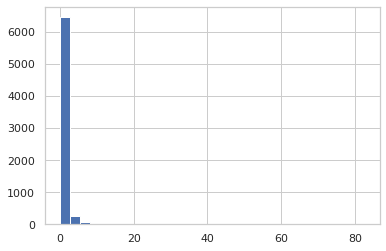

In [ ]:
x = data['Global_Sales']
plt.hist(x, bins =30)
plt.show()

In [ ]:
data['Sales']=0
data['plat_mean']=0
data['plat_sales']=0

In [ ]:
x=0
plat='Wii'

for x in range (len(data)):
    for plat in data['Platform'].unique():
        if data.iloc[x,1] == plat:
            data.iloc[x,17] = data.loc[data['Platform']==plat, 'Global_Sales'].mean(skipna=True)

x=0
for x in range (len(data)):
    if data.iloc[x, 9] > data.iloc[x,17]:
        data.iloc[x, 18] = 1
        

In [ ]:

for x in range (len(data)):
    if data.iloc[x, 9] > data['Global_Sales'].mean(skipna=True):
        data.iloc[x, 16] = 1

Bucketizing User Ratings from numeric to Alpha

In [ ]:
data['user_rating']="E"
bins = [0,2,4,6,8,10]
groupnames = ('F','D','C','B','A')
data['user_rating'] = pd.cut(data.User_Score.astype(float), bins, labels = groupnames)

In [ ]:
data.sample(20)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,Sales,plat_mean,plat_sales,user_rating
6271,Need for Speed: The Run,Wii,2011.0,Action,Electronic Arts,0.11,0.12,0.01,0.03,0.27,64.0,6.0,3.6,21.0,Firebrand Games,E10+,0,1.375741,0,D
15019,The Lord of the Rings: Conquest,PC,2009.0,Action,Electronic Arts,0.00,0.02,0.00,0.00,0.02,57.0,24.0,6.7,42.0,Pandemic Studios,T,0,0.287435,0,B
1932,Naruto: Ultimate Ninja Storm,PS3,2008.0,Fighting,Namco Bandai Games,0.49,0.34,0.09,0.15,1.07,75.0,32.0,8.6,95.0,CyberConnect2,T,1,1.019896,1,A
5031,Pokemon Channel,GC,2003.0,Adventure,Nintendo,0.24,0.06,0.07,0.01,0.38,55.0,21.0,6,22.0,Ambrella,E,0,0.458103,0,C
6083,Earthworm Jim,GBA,2001.0,Platform,Interplay,0.20,0.08,0.00,0.01,0.29,72.0,10.0,5.7,6.0,Game Titan,E,0,0.555907,0,C
13874,Dead Rising,PS4,2016.0,Action,Capcom,0.02,0.00,0.01,0.01,0.04,78.0,6.0,6.6,30.0,Capcom,M,0,1.016862,0,B
8552,NBA Live 08,Wii,2007.0,Sports,Electronic Arts,0.14,0.00,0.00,0.01,0.16,52.0,11.0,7.1,21.0,EA Canada,E,0,1.375741,0,B
3561,The Legend of Spyro: Dawn of the Dragon,Wii,2008.0,Platform,Vivendi Games,0.34,0.17,0.00,0.05,0.56,64.0,11.0,6.5,19.0,Etranges Libellules,E10+,0,1.375741,0,B
1380,LEGO Indiana Jones 2: The Adventure Continues,Wii,2009.0,Action,Activision,0.90,0.38,0.00,0.12,1.40,72.0,13.0,6.1,14.0,Traveller's Tales,E10+,1,1.375741,1,B
1060,BioShock Infinite,PS3,2013.0,Shooter,Take-Two Interactive,0.72,0.65,0.04,0.28,1.69,94.0,27.0,8.5,1863.0,Irrational Games,M,1,1.019896,1,A


In [ ]:
data['Sales'].value_counts()

0    5156
1    1669
Name: Sales, dtype: int64

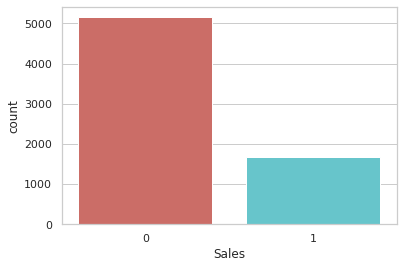

<Figure size 432x288 with 0 Axes>

In [ ]:
sns.countplot(x='Sales',data=data, palette='hls')
plt.show()
plt.savefig('count_plot')

In [ ]:
count_low_sales = len(data[data['Sales']==0])
count_abv_sales = len(data[data['Sales']==1])
pct_of_low_sales = count_low_sales/(count_low_sales+count_abv_sales)
print("percentage of games with sales below average global sales is", pct_of_low_sales*100)
pct_of_abv_sales = count_abv_sales/(count_low_sales+count_abv_sales)
print("percentage of games with sales above average global sales is", pct_of_abv_sales*100)

percentage of games with sales below average global sales is 75.54578754578755
percentage of games with sales above average global sales is 24.454212454212453


In [ ]:
data.groupby('Sales').mean()

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Count,plat_mean,plat_sales
Sales,,,,,,,,,,,
0,2007.393910,0.137135,0.067676,0.019325,0.023452,0.247901,67.570597,24.851435,97.06924,0.741933,0.061094
1,2007.569203,1.189503,0.756363,0.202660,0.265638,2.413942,78.617735,41.534452,414.61414,0.887743,0.849611


In [ ]:
data.groupby('Platform').mean()

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Count,Sales,plat_mean,plat_sales
Platform,,,,,,,,,,,,
3DS,2012.632258,0.314000,0.215032,0.216581,0.049355,0.795032,68.064516,31.993548,102.270968,0.219355,0.795032,0.219355
DC,2000.071429,0.110000,0.020714,0.190000,0.004286,0.325000,87.357143,17.642857,84.500000,0.142857,0.325000,0.285714
DS,2007.370690,0.373707,0.205388,0.180302,0.064353,0.823987,66.523707,23.484914,30.183190,0.215517,0.823987,0.204741
GBA,2003.084388,0.334979,0.137553,0.068059,0.015105,0.555907,70.400844,15.940928,24.156118,0.189873,0.555907,0.308017
GC,2003.316092,0.310144,0.088879,0.046322,0.012270,0.458103,71.204023,21.859195,37.238506,0.160920,0.458103,0.250000
PC,2009.058372,0.097942,0.161014,0.000261,0.027343,0.287435,76.261137,28.717358,699.064516,0.087558,0.287435,0.208909
PS,1999.366667,0.611733,0.430533,0.259000,0.076400,1.377000,73.853333,11.013333,77.246667,0.406667,1.377000,0.253333
PS2,2003.738596,0.414605,0.223807,0.066500,0.124921,0.829798,69.492105,24.750877,46.052632,0.278070,0.829798,0.268421
PS3,2010.091027,0.444239,0.355657,0.070897,0.149298,1.019896,70.953186,34.921977,227.490247,0.368010,1.019896,0.274382


In [ ]:
data.groupby('Publisher').mean()

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Count,Sales,plat_mean,plat_sales
Publisher,,,,,,,,,,,,
10TACLE Studios,2006.000000,0.010000,0.010000,0.0000,0.000000,0.020000,42.000000,4.000000,5.000000,0.000000,0.829798,0.0000
1C Company,2010.000000,0.005000,0.020000,0.0000,0.005000,0.030000,79.500000,23.000000,125.500000,0.000000,0.287435,0.0000
2D Boy,2008.000000,0.000000,0.030000,0.0000,0.010000,0.040000,90.000000,26.000000,607.000000,0.000000,0.287435,0.0000
3DO,2001.200000,0.086667,0.062667,0.0000,0.019333,0.165333,55.333333,12.466667,7.533333,0.000000,0.908942,0.0000
505 Games,2009.312500,0.207375,0.135375,0.0115,0.041000,0.396375,63.325000,21.175000,107.750000,0.100000,0.905911,0.0625
...,...,...,...,...,...,...,...,...,...,...,...,...
Zoo Games,2008.666667,0.416667,0.000000,0.0000,0.030000,0.446667,60.333333,8.000000,5.666667,0.333333,1.375741,0.0000
Zushi Games,2009.000000,0.180000,0.010000,0.0000,0.010000,0.210000,68.000000,34.000000,19.000000,0.000000,0.994522,0.0000
bitComposer Games,2010.000000,0.000000,0.025000,0.0000,0.010000,0.030000,69.000000,9.500000,22.000000,0.000000,0.287435,0.0000


In [ ]:
data.head()
#

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,Sales,plat_mean,plat_sales,user_rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E,1,1.375741,1,B
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E,1,1.375741,1,A
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E,1,1.375741,1,B
6,New Super Mario Bros.,DS,2006.0,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65.0,8.5,431.0,Nintendo,E,1,0.823987,1,A
7,Wii Play,Wii,2006.0,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41.0,6.6,129.0,Nintendo,E,1,1.375741,1,B


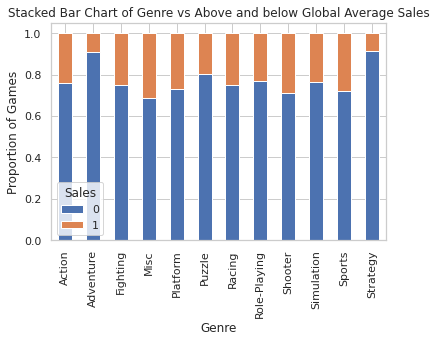

In [ ]:
table=pd.crosstab(data.Genre,data.Sales)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of Genre vs Above and below Global Average Sales')
plt.xlabel('Genre')
plt.ylabel('Proportion of Games')
plt.show()

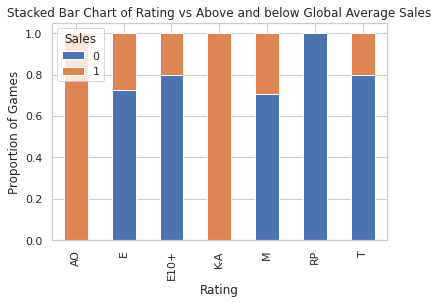

In [ ]:
table=pd.crosstab(data.Rating,data.Sales)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of Rating vs Above and below Global Average Sales')
plt.xlabel('Rating')
plt.ylabel('Proportion of Games')
plt.show()

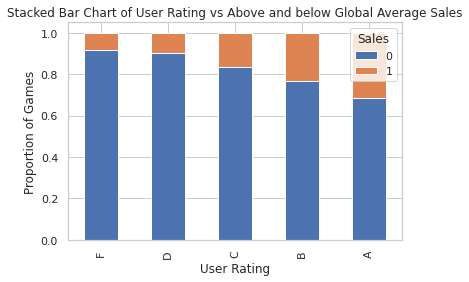

In [ ]:
table=pd.crosstab(data.user_rating,data.Sales)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of User Rating vs Above and below Global Average Sales')
plt.xlabel('User Rating')
plt.ylabel('Proportion of Games')
plt.show()

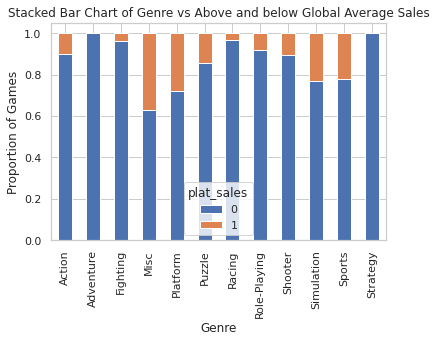

In [ ]:
platDF = data.loc[data['Platform']=='Wii']

table=pd.crosstab(platDF.Genre,platDF.plat_sales)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of Genre vs Above and below Global Average Sales')
plt.xlabel('Genre')
plt.ylabel('Proportion of Games')
plt.show()

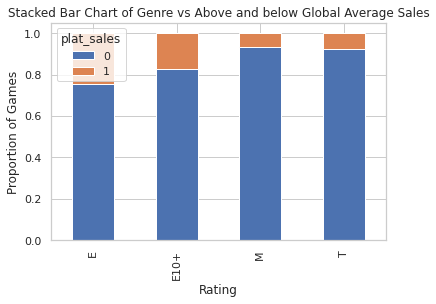

In [ ]:
platDF = data.loc[data['Platform']=='Wii']

table=pd.crosstab(platDF.Rating,platDF.plat_sales)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of Genre vs Above and below Global Average Sales')
plt.xlabel('Rating')
plt.ylabel('Proportion of Games')
plt.show()

In [ ]:
data['Platform'].unique()

array(['Wii', 'DS', 'X360', 'PS3', 'PS2', '3DS', 'PS4', 'PS', 'XB', 'PC',
       'PSP', 'WiiU', 'GC', 'GBA', 'XOne', 'PSV', 'DC'], dtype=object)

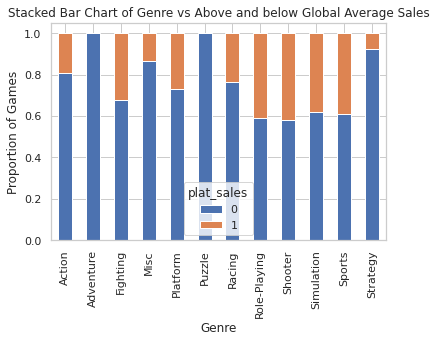

In [ ]:
platDF = data.loc[data['Platform']=='XB']

table=pd.crosstab(platDF.Genre,platDF.plat_sales)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of Genre vs Above and below Global Average Sales')
plt.xlabel('Genre')
plt.ylabel('Proportion of Games')
plt.show()

In [ ]:
platDF

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating,Sales,plat_mean,plat_sales,user_rating
78,Halo 2,XB,2004.0,Shooter,Microsoft Game Studios,6.82,1.53,0.05,0.08,8.49,95.0,91.0,8.2,1218.0,Bungie Software,M,1,0.375345,1,A
129,Halo: Combat Evolved,XB,2001.0,Shooter,Microsoft Game Studios,4.98,1.30,0.08,0.07,6.43,97.0,68.0,8.6,1283.0,Bungie Software,M,1,0.375345,1,A
466,Tom Clancy's Splinter Cell,XB,2002.0,Action,Ubisoft,1.85,1.04,0.00,0.13,3.02,93.0,46.0,8.5,121.0,Ubisoft Montreal,T,1,0.375345,1,A
508,The Elder Scrolls III: Morrowind,XB,2002.0,Role-Playing,Ubisoft,2.09,0.63,0.03,0.11,2.86,87.0,34.0,8.7,111.0,Bethesda Softworks,T,1,0.375345,1,A
569,Fable,XB,2004.0,Role-Playing,Microsoft Game Studios,1.99,0.58,0.00,0.09,2.66,85.0,87.0,8.5,268.0,Big Blue Box,M,1,0.375345,1,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15991,Antz Extreme Racing,XB,2002.0,Racing,Empire Interactive,0.01,0.00,0.00,0.00,0.02,35.0,4.0,8.7,10.0,Supersonic Software,E,0,0.375345,0,A
16039,Hummer Badlands,XB,2006.0,Racing,Global Star,0.01,0.00,0.00,0.00,0.02,44.0,7.0,6,5.0,Eutechnyx,E,0,0.375345,0,C
16196,Grooverider: Slot Car Thunder,XB,2003.0,Racing,Encore,0.01,0.00,0.00,0.00,0.01,45.0,9.0,7.3,8.0,King of the Jungle,E,0,0.375345,0,B
16205,Aeon Flux,XB,2005.0,Action,THQ,0.01,0.00,0.00,0.00,0.01,69.0,27.0,3,4.0,Terminal Reality,T,0,0.375345,0,D


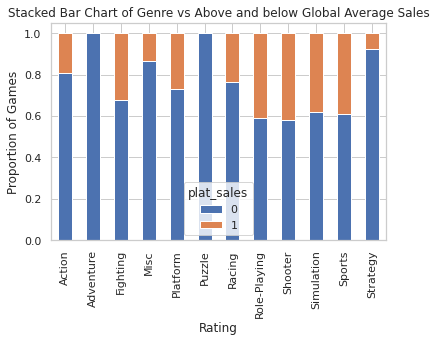

In [ ]:
platDF = data.loc[data['Platform']=='XB']

table=pd.crosstab(platDF.Genre,platDF.plat_sales)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of Genre vs Above and below Global Average Sales')
plt.xlabel('Rating')
plt.ylabel('Proportion of Games')
plt.show()

## **Logistic Regression By Platform Group**

Platform Groups Accuracy
Wii - 91% 
Xbox - 91%
Playstation - 93%
PC - 93%
*Genres perform differently in different platform groups.


In [ ]:
DF = data.dropna()
DF2 = DF.drop(["NA_Sales"
               ,"EU_Sales"
               ,"JP_Sales"
               ,"Other_Sales"
               ,"Global_Sales"
               ,"plat_mean"
               ,"Name",
               "Publisher"
#               ,"[plat_sales]"
#               ,"Sales"
               ]
               , axis=1
               )

data_final = pd.get_dummies(DF2, columns=['Genre','Platform','user_rating','Rating','Developer'], drop_first = True)
data_final.head()

,Year_of_Release,Critic_Score,Critic_Count,User_Score,User_Count,Sales,plat_sales,Genre_Adventure,Genre_Fighting,Genre_Misc,Genre_Platform,Genre_Puzzle,Genre_Racing,Genre_Role-Playing,Genre_Shooter,Genre_Simulation,Genre_Sports,Genre_Strategy,Platform_DC,Platform_DS,Platform_GBA,Platform_GC,Platform_PC,Platform_PS,Platform_PS2,Platform_PS3,Platform_PS4,Platform_PSP,Platform_PSV,Platform_Wii,Platform_WiiU,Platform_X360,Platform_XB,Platform_XOne,user_rating_D,user_rating_C,user_rating_B,user_rating_A,Rating_E,Rating_E10+,...,Developer_Webfoot Technologies,Developer_Westwood Studios,Developer_Wicked Witch Software,Developer_WideScreen Games,Developer_Wideload Games Inc.,Developer_Wildfire Studios,Developer_WinkySoft,Developer_Wizarbox,Developer_WorkJam,Developer_Wow Entertainment,Developer_Xpec,Developer_Yacht Club Games,Developer_Yager,Developer_Yuke's,"Developer_Z-Axis, Ltd.",Developer_Zed Two Limited,Developer_Zen Studios,Developer_Zener Works,Developer_ZeniMax Media,Developer_Zerodiv,Developer_Zindagi Games,Developer_Zipper Interactive,Developer_Zoe Mode,"Developer_Zoe Mode, HB Studios Multimedia",Developer_Zombie,Developer_Zombie Studios,Developer_Zono Inc.,Developer_Zoo Games,Developer_Zoom,Developer_ZootFly,Developer_h.a.n.d. Inc.,Developer_iNiS,Developer_id Software,"Developer_id Software, Nerve Software","Developer_id Software, Raven Software",Developer_n-Space,Developer_neo Software,Developer_odenis studio,Developer_syn Sophia,Developer_zSlide
0,2006.0,76.0,51.0,8,322.0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2008.0,82.0,73.0,8.3,709.0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2009.0,80.0,73.0,8,192.0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,2006.0,89.0,65.0,8.5,431.0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,2006.0,58.0,41.0,6.6,129.0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
data_final.sample(20)

,Year_of_Release,Critic_Score,Critic_Count,User_Score,User_Count,Sales,plat_sales,Genre_Adventure,Genre_Fighting,Genre_Misc,Genre_Platform,Genre_Puzzle,Genre_Racing,Genre_Role-Playing,Genre_Shooter,Genre_Simulation,Genre_Sports,Genre_Strategy,Platform_DC,Platform_DS,Platform_GBA,Platform_GC,Platform_PC,Platform_PS,Platform_PS2,Platform_PS3,Platform_PS4,Platform_PSP,Platform_PSV,Platform_Wii,Platform_WiiU,Platform_X360,Platform_XB,Platform_XOne,user_rating_D,user_rating_C,user_rating_B,user_rating_A,Rating_E,Rating_E10+,...,Developer_Webfoot Technologies,Developer_Westwood Studios,Developer_Wicked Witch Software,Developer_WideScreen Games,Developer_Wideload Games Inc.,Developer_Wildfire Studios,Developer_WinkySoft,Developer_Wizarbox,Developer_WorkJam,Developer_Wow Entertainment,Developer_Xpec,Developer_Yacht Club Games,Developer_Yager,Developer_Yuke's,"Developer_Z-Axis, Ltd.",Developer_Zed Two Limited,Developer_Zen Studios,Developer_Zener Works,Developer_ZeniMax Media,Developer_Zerodiv,Developer_Zindagi Games,Developer_Zipper Interactive,Developer_Zoe Mode,"Developer_Zoe Mode, HB Studios Multimedia",Developer_Zombie,Developer_Zombie Studios,Developer_Zono Inc.,Developer_Zoo Games,Developer_Zoom,Developer_ZootFly,Developer_h.a.n.d. Inc.,Developer_iNiS,Developer_id Software,"Developer_id Software, Nerve Software","Developer_id Software, Raven Software",Developer_n-Space,Developer_neo Software,Developer_odenis studio,Developer_syn Sophia,Developer_zSlide
9265,2004.0,76.0,21.0,6.4,18.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9281,2002.0,66.0,20.0,8.8,13.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3782,2006.0,72.0,57.0,8.4,83.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
797,2015.0,74.0,58.0,7.9,1287.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7404,2011.0,79.0,9.0,7,12.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1213,2003.0,88.0,23.0,9,713.0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8675,2003.0,66.0,22.0,6.8,6.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7390,2001.0,78.0,18.0,8.2,19.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7234,2016.0,88.0,22.0,6.8,156.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1215,2006.0,90.0,78.0,8,215.0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
X = data_final.loc[:, data_final.columns != 'Sales']
y = data_final.loc[:, data_final.columns == 'Sales']

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

import imblearn
from imblearn.over_sampling import SMOTE
print(imblearn.__version__)

0.4.3


/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
cols=['Critic_Score'
      , 'Critic_Count'
#      , 'Year_of_Release'
      , 'User_Count'
      ,'Genre_Adventure'
#      , 'Genre_Fighting'
      , 'Genre_Misc'
#      , 'Genre_Platform'
      , 'Genre_Puzzle'
#      , 'Genre_Racing'
      , 'Genre_Role-Playing'
#      , 'Genre_Shooter'
      , 'Genre_Simulation'
#      , 'Genre_Sports'
      , 'Genre_Strategy'
#      , 'Platform_DC'
      , 'Platform_DS'
      , 'Platform_GBA'
      , 'Platform_GC'
      , 'Platform_PC'
      , 'Platform_PS'
      , 'Platform_PS2'
      , 'Platform_PS3'
      , 'Platform_PS4'
#      , 'Platform_PSP'
      , 'Platform_PSV'
      , 'Platform_Wii'
#      , 'Platform_WiiU'
#      , 'Platform_X360'
      , 'Platform_XB'
      , 'Platform_XOne'
#      , 'user_rating_D'
#      , 'user_rating_C'
#      , 'user_rating_B'
#      , 'user_rating_A'
      , 'Rating_E'
      , 'Rating_E10+'
#      , 'Rating_K-A'
      , 'Rating_M'
#      , 'Rating_RP'
      , 'Rating_T'
     ] 
X=pd.DataFrame(data_final[cols])
X

,Critic_Score,Critic_Count,User_Count,Genre_Adventure,Genre_Misc,Genre_Puzzle,Genre_Role-Playing,Genre_Simulation,Genre_Strategy,Platform_DS,Platform_GBA,Platform_GC,Platform_PC,Platform_PS,Platform_PS2,Platform_PS3,Platform_PS4,Platform_PSV,Platform_Wii,Platform_XB,Platform_XOne,Rating_E,Rating_E10+,Rating_M,Rating_T
0,76.0,51.0,322.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
2,82.0,73.0,709.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
3,80.0,73.0,192.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
6,89.0,65.0,431.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7,58.0,41.0,129.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16667,46.0,4.0,21.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
16677,81.0,12.0,9.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
16696,80.0,20.0,412.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
16700,61.0,12.0,43.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
import statsmodels.api as sm

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

model = LogisticRegression()
result = model.fit(X_train,y_train.values.ravel())

logit = sm.Probit(data['Sales'], data_final[cols])

# fit the model
result = logit.fit()

print(result.summary())

Optimization terminated successfully.
         Current function value: 0.400681
         Iterations 7
                          Probit Regression Results                           
Dep. Variable:                  Sales   No. Observations:                 6825
Model:                         Probit   Df Residuals:                     6800
Method:                           MLE   Df Model:                           24
Date:                Sun, 14 Jun 2020   Pseudo R-squ.:                  0.2797
Time:                        00:54:22   Log-Likelihood:                -2734.6
converged:                       True   LL-Null:                       -3796.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Critic_Score           0.0347      0.002     18.577      0.000       0.031       0.038
Criti

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [ ]:
print(result.conf_int())

                           0         1
Critic_Score        0.031044  0.038368
Critic_Count        0.020038  0.025027
User_Count          0.000394  0.000570
Genre_Adventure    -0.903553 -0.346320
Genre_Misc          0.140835  0.448670
Genre_Puzzle       -0.798996 -0.191807
Genre_Role-Playing -0.415807 -0.148328
Genre_Simulation    0.143451  0.512616
Genre_Strategy     -0.855361 -0.331261
Platform_DS         0.134698  0.479714
Platform_GBA       -0.044568  0.403005
Platform_GC        -0.313798  0.084935
Platform_PC        -1.531848 -1.067680
Platform_PS         0.708988  1.208829
Platform_PS2        0.301485  0.549371
Platform_PS3        0.237058  0.502782
Platform_PS4       -0.338724  0.100789
Platform_PSV       -1.333444 -0.438266
Platform_Wii        0.466011  0.783518
Platform_XB        -0.626760 -0.280620
Platform_XOne       0.031387  0.538664
Rating_E           -4.144381 -3.588648
Rating_E10+        -4.379712 -3.809895
Rating_M           -4.507695 -3.939077
Rating_T           -4.478

In [ ]:
y_pred = model.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(model.score(X_test, y_test)))

from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

Accuracy of logistic regression classifier on test set: 0.83
[[1476   82]
 [ 260  230]]


In [ ]:
wii_plat = data_final.loc[data_final['Platform_Wii']==1]

X = wii_plat.loc[:, wii_plat.columns != 'plat_sales']
y = wii_plat.loc[:, wii_plat.columns == 'plat_sales']

cols=['Critic_Score'
      , 'Critic_Count'
#      , 'Year_of_Release'
      , 'User_Count'
      , 'Genre_Adventure'
#      , 'Genre_Fighting'
      , 'Genre_Misc'
#      , 'Genre_Platform'
      , 'Genre_Puzzle'
#      , 'Genre_Racing'
      , 'Genre_Role-Playing'
#      , 'Genre_Shooter'
#      , 'Genre_Simulation'
#      , 'Genre_Sports'
      , 'Genre_Strategy'
#      , 'Platform_DC'
#      , 'Platform_DS'
#      , 'Platform_GBA'
#      , 'Platform_GC'
#      , 'Platform_PC'
#      , 'Platform_PS'
#      , 'Platform_PS2'
#      , 'Platform_PS3'
#      , 'Platform_PS4'
#      , 'Platform_PSP'
#      , 'Platform_PSV'
      , 'Platform_Wii'
      , 'Platform_WiiU'
#      , 'Platform_X360'
#      , 'Platform_XB'
#      , 'Platform_XOne'
#      , 'user_rating_D'
#      , 'user_rating_C'
#      , 'user_rating_B'
#      , 'user_rating_A'
#      , 'Rating_E'
#      , 'Rating_E10+'
#      , 'Rating_K-A'
#      , 'Rating_M'
#      , 'Rating_RP'
#      , 'Rating_T'
     ] 
#X=pd.DataFrame(data_final[cols])
print(X)
print(y)

import statsmodels.api as sm

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

model = LogisticRegression()
result = model.fit(X_train,y_train.values.ravel())

logit = sm.Probit(data['Sales'], data_final[cols])

# fit the model
result = logit.fit()

print(result.summary())

y_pred = model.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(model.score(X_test, y_test)))

from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

       Year_of_Release  Critic_Score  ...  Developer_syn Sophia Developer_zSlide
0               2006.0          76.0  ...                     0                0
2               2008.0          82.0  ...                     0                0
3               2009.0          80.0  ...                     0                0
7               2006.0          58.0  ...                     0                0
8               2009.0          87.0  ...                     0                0
...                ...           ...  ...                   ...              ...
15118           2008.0          35.0  ...                     0                0
15165           2008.0          62.0  ...                     0                0
15345           2007.0          19.0  ...                     0                0
15723           2008.0          40.0  ...                     0                0
16311           2009.0          75.0  ...                     0                0

[479 rows x 1331 columns]
 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [ ]:
xb_plat = data_final.loc[data_final['Platform_XB']==1]
xone_plat = data_final.loc[data_final['Platform_XOne']==1]
x360_plat = data_final.loc[data_final['Platform_X360']==1]
XB_plat=xb_plat.append(xone_plat)
XB_plat=XB_plat.append(x360_plat)

X = XB_plat.loc[:, XB_plat.columns != 'plat_sales']
y = XB_plat.loc[:, XB_plat.columns == 'plat_sales']

cols=['Critic_Score'
      , 'Critic_Count'
      , 'Year_of_Release'
      , 'User_Count'
      , 'Genre_Adventure'
#      , 'Genre_Fighting'
      , 'Genre_Misc'
      , 'Genre_Platform'
      , 'Genre_Puzzle'
#      , 'Genre_Racing'
      , 'Genre_Role-Playing'
      , 'Genre_Shooter'
#      , 'Genre_Simulation'
      , 'Genre_Sports'
      , 'Genre_Strategy'
#      , 'Platform_DC'
#      , 'Platform_DS'
#      , 'Platform_GBA'
#      , 'Platform_GC'
#      , 'Platform_PC'
#      , 'Platform_PS'
#      , 'Platform_PS2'
#      , 'Platform_PS3'
#      , 'Platform_PS4'
#      , 'Platform_PSP'
#      , 'Platform_PSV'
#      , 'Platform_Wii'
#      , 'Platform_WiiU'
      , 'Platform_X360'
      , 'Platform_XB'
      , 'Platform_XOne'
#      , 'user_rating_D'
#      , 'user_rating_C'
#      , 'user_rating_B'
#      , 'user_rating_A'
#      , 'Rating_E'
#      , 'Rating_E10+'
#      , 'Rating_K-A'
#      , 'Rating_M'
#      , 'Rating_RP'
#      , 'Rating_T'
     ] 
#X=pd.DataFrame(data_final[cols])
print(X)
print(y)

import statsmodels.api as sm

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

model = LogisticRegression()
result = model.fit(X_train,y_train.values.ravel())

logit = sm.Probit(data['Sales'], data_final[cols])

# fit the model
result = logit.fit()

print(result.summary())

y_pred = model.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(model.score(X_test, y_test)))

from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

       Year_of_Release  Critic_Score  ...  Developer_syn Sophia Developer_zSlide
78              2004.0          95.0  ...                     0                0
129             2001.0          97.0  ...                     0                0
466             2002.0          93.0  ...                     0                0
508             2002.0          87.0  ...                     0                0
569             2004.0          85.0  ...                     0                0
...                ...           ...  ...                   ...              ...
15615           2012.0          64.0  ...                     0                0
15627           2012.0          62.0  ...                     0                0
15745           2007.0          75.0  ...                     0                0
16314           2008.0          77.0  ...                     0                0
16617           2012.0          49.0  ...                     0                0

[1582 rows x 1331 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [ ]:
ps_plat = data_final.loc[data_final['Platform_PS']==1]
ps2_plat = data_final.loc[data_final['Platform_PS2']==1]
ps3_plat = data_final.loc[data_final['Platform_PS3']==1]
ps4_plat = data_final.loc[data_final['Platform_PS4']==1]
psp_plat = data_final.loc[data_final['Platform_PSP']==1]
psv_plat = data_final.loc[data_final['Platform_PSV']==1]
PS_plat=ps_plat.append(ps2_plat)
PS_plat=PS_plat.append(ps3_plat)
PS_plat=PS_plat.append(ps4_plat)
PS_plat=PS_plat.append(psp_plat)
PS_plat=PS_plat.append(psv_plat)

X = PS_plat.loc[:, PS_plat.columns != 'plat_sales']
y = PS_plat.loc[:, PS_plat.columns == 'plat_sales']

cols=['Critic_Score'
      , 'Critic_Count'
      , 'Year_of_Release'
      , 'User_Count'
      , 'Genre_Adventure'
#      , 'Genre_Fighting'
      , 'Genre_Misc'
      , 'Genre_Platform'
#      , 'Genre_Puzzle'
#      , 'Genre_Racing'
      , 'Genre_Role-Playing'
      , 'Genre_Shooter'
      , 'Genre_Simulation'
      , 'Genre_Sports'
      , 'Genre_Strategy'
#      , 'Platform_DC'
#      , 'Platform_DS'
#      , 'Platform_GBA'
#      , 'Platform_GC'
#      , 'Platform_PC'
      , 'Platform_PS'
      , 'Platform_PS2'
      , 'Platform_PS3'
      , 'Platform_PS4'
      , 'Platform_PSP'
      , 'Platform_PSV'
#      , 'Platform_Wii'
#      , 'Platform_WiiU'
#      , 'Platform_X360'
#      , 'Platform_XB'
#      , 'Platform_XOne'
#      , 'user_rating_D'
#      , 'user_rating_C'
#      , 'user_rating_B'
#      , 'user_rating_A'
#      , 'Rating_E'
#      , 'Rating_E10+'
#      , 'Rating_K-A'
#      , 'Rating_M'
#      , 'Rating_RP'
#      , 'Rating_T'
     ] 
#X=pd.DataFrame(data_final[cols])
print(X)
print(y)

import statsmodels.api as sm

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

model = LogisticRegression()
result = model.fit(X_train,y_train.values.ravel())

logit = sm.Probit(data['Sales'], data_final[cols])

# fit the model
result = logit.fit()

print(result.summary())

y_pred = model.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(model.score(X_test, y_test)))

from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

       Year_of_Release  Critic_Score  ...  Developer_syn Sophia Developer_zSlide
52              1997.0          96.0  ...                     0                0
65              1997.0          92.0  ...                     0                0
67              1999.0          93.0  ...                     0                0
88              1999.0          90.0  ...                     0                0
106             1998.0          96.0  ...                     0                0
...                ...           ...  ...                   ...              ...
15200           2016.0          64.0  ...                     0                0
15514           2015.0          70.0  ...                     0                0
16263           2014.0          58.0  ...                     0                0
16276           2013.0          66.0  ...                     0                0
16377           2012.0          76.0  ...                     0                0

[2806 rows x 1331 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Optimization terminated successfully.
         Current function value: 0.430400
         Iterations 7
                          Probit Regression Results                           
Dep. Variable:                  Sales   No. Observations:                 6825
Model:                         Probit   Df Residuals:                     6807
Method:                           MLE   Df Model:                           17
Date:                Sun, 14 Jun 2020   Pseudo R-squ.:                  0.2263
Time:                        00:55:54   Log-Likelihood:                -2937.5
converged:                       True   LL-Null:                       -3796.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Critic_Score           0.0300      0.002     16.895      0.000       0.026       0.033
Criti

In [ ]:
PC_plat = data_final.loc[data_final['Platform_PC']==1]

X = PS_plat.loc[:, PC_plat.columns != 'plat_sales']
y = PS_plat.loc[:, PC_plat.columns == 'plat_sales']

cols=['Critic_Score'
      , 'Critic_Count'
      , 'Year_of_Release'
      , 'User_Count'
      , 'Genre_Adventure'
#      , 'Genre_Fighting'
      , 'Genre_Misc'
#      , 'Genre_Platform'
      , 'Genre_Puzzle'
#      , 'Genre_Racing'
      , 'Genre_Role-Playing'
#      , 'Genre_Shooter'
      , 'Genre_Simulation'
      , 'Genre_Sports'
      , 'Genre_Strategy'
#      , 'Platform_DC'
#      , 'Platform_DS'
#      , 'Platform_GBA'
#      , 'Platform_GC'
      , 'Platform_PC'
#      , 'Platform_PS'
#      , 'Platform_PS2'
#      , 'Platform_PS3'
#      , 'Platform_PS4'
#      , 'Platform_PSP'
#      , 'Platform_PSV'
#      , 'Platform_Wii'
#      , 'Platform_WiiU'
#      , 'Platform_X360'
#      , 'Platform_XB'
#      , 'Platform_XOne'
#      , 'user_rating_D'
#      , 'user_rating_C'
#      , 'user_rating_B'
#      , 'user_rating_A'
#      , 'Rating_E'
#      , 'Rating_E10+'
#      , 'Rating_K-A'
#      , 'Rating_M'
#      , 'Rating_RP'
#      , 'Rating_T'
     ] 
#X=pd.DataFrame(data_final[cols])
print(X)
print(y)

import statsmodels.api as sm

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

model = LogisticRegression()
result = model.fit(X_train,y_train.values.ravel())

logit = sm.Probit(data['Sales'], data_final[cols])

# fit the model
result = logit.fit()

print(result.summary())

y_pred = model.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(model.score(X_test, y_test)))

from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

       Year_of_Release  Critic_Score  ...  Developer_syn Sophia Developer_zSlide
52              1997.0          96.0  ...                     0                0
65              1997.0          92.0  ...                     0                0
67              1999.0          93.0  ...                     0                0
88              1999.0          90.0  ...                     0                0
106             1998.0          96.0  ...                     0                0
...                ...           ...  ...                   ...              ...
15200           2016.0          64.0  ...                     0                0
15514           2015.0          70.0  ...                     0                0
16263           2014.0          58.0  ...                     0                0
16276           2013.0          66.0  ...                     0                0
16377           2012.0          76.0  ...                     0                0

[2806 rows x 1331 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Optimization terminated successfully.
         Current function value: 0.424261
         Iterations 7
                          Probit Regression Results                           
Dep. Variable:                  Sales   No. Observations:                 6825
Model:                         Probit   Df Residuals:                     6813
Method:                           MLE   Df Model:                           11
Date:                Sun, 14 Jun 2020   Pseudo R-squ.:                  0.2373
Time:                        00:56:12   Log-Likelihood:                -2895.6
converged:                       True   LL-Null:                       -3796.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Critic_Score           0.0347      0.002     19.380      0.000       0.031       0.038
Criti

Platform Groups Accuracy
1. Wii - 91% 
2. Xbox - 91%
3. Playstation - 93%
4. PC - 93%
*Genres perform differently in different platform groups.


# **Recommendations**


## **Answers to Questions**

1. Can we accurately predict the sales of a game in Global? 
- With the models and data we have we are not able to accurately determine how well a game will sell in term of exact dollars.


2.  Can we predict whether a game will sell above or below the median price?
- Yes we can predict this with an accuracy of 82%


3. What is the best model to predict sales of games in the world? 
- The best model to predict above or below median sales is Logistic Regression. 


4. Which platform will produce the most future Sales?
- A newer platform according to out data Sony is the best seller (PS4), PC also will forever be a platform of choice. 

## **Conclusion**


1. Video Games Developers should target Rating, Genre, and Platform.
2. Genre associated with Adults will have higher likelihood of sales.
3. Logistics Regression performed well, 82% accurate.
4. Logistic Regression Improved to 91-93% by grouping platforms.
5. Random Forest performed well but not as well as Logistic Regression.
    a. Regressor 58%
    b. Classifier 36%
6. Naive Bayes was 49% accurate.
7. Linear Regression was 47% accurate.





## **Room for Improvement**

1. The data is very incomplete (i.e Global Sales does not equal sum of all continents sales)
2. Revenue over time is missing.   All revenues are tied to the year the game was released.  Would be good to see timing of revenues
3. Could have used a binning for sales (High, Medium, Low)
4. Have more up-to-date data 
5. Platforms have product life cycles, connecting consoles and their influences across time.
6. Add Mobile Gaming titles to compare.  Most Mobile Games are free, but have in-game purchase amounts.  Reviewing total revenue per game title and platform may give us a better picture of the Video Game Industry.
